# Reliance Industries: Equity Performance Review and Future Trends Forecast

## Project Focus: "Strategic Forecasting and Analysis of Reliance Industries' Stock Performance"

Predict the Reliance Industries Stock Price for the next 30 days.

There are Open, High, Low and Close prices that you need to obtain from the web for each day starting from 2000 to 2024 for Reliance Industries stock.

- Split the last year into a test set- to build a model to predict stock price.

- Find short term, & long term trends.

- Understand how it is impacted from external factors or any big external events.

- Forecast for next 30 days.

## Data Acquisition Strategy for Reliance Industries Stock Analysis

- For this project, we will be using the Yfinance library to get the data, which makes it easy to process.

- We collected data from 3-Jan-2000 to 04-Jan-2024.

- But also you can download data from ‘Yahoo! Finance’ website. You can use Below link. 

- https://finance.yahoo.com/quote/RELIANCE.NS/history?p=RELIANCE.NS

## About the data

- Date: This column records the specific data for each entry. In stock market context, this usually refers to a trading day.

- Open: This is the price of the stock at the beginning of the trading day.

- High: This column shows the highest price of the stock during the trading day.

- Low: Conversely, this column indicates the lowest price of the stock on that particular day.

- Close: This is the price of the stock at the end of the trading day. It's often used as the reference price for the stock's     performance on the day.

- Adj  Close: Adjusted close price adjusted for splits and dividend and/or capital gain distributions.

- Volume: This column shows the number of shares of the stock that were traded during the day. High volume can indicate high       intrest or significant new about the company, where as low volume mighit suggest lesser activity.

# Importing Libraries

In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib as mpl
import datetime
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
plt.style.use('seaborn')
mpl.rc('axes', titlesize=14, titleweight='semibold')
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing # SES
from statsmodels.tsa.holtwinters import Holt # Holts Exponential Smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing 
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM, GRU

from itertools import cycle

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

C:\Users\91901\AppData\Local\Temp\ipykernel_12752\1755625386.py:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


# Reading DataSet

In [2]:
# Importing dataset
data=yf.download('RELIANCE.NS', start='2000-1-1', end='2024-1-05').reset_index(drop=False)
reliance_0 = pd.DataFrame(data)

[*********************100%%**********************]  1 of 1 completed


In [3]:
reliance_0.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,29.579710,28802010
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,31.947731,61320457
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,33.199314,173426953
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,34.591927,101355113
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,36.965816,128426756


In [4]:
reliance_0.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
5989,2023-12-29,2611.100098,2614.000000,2579.300049,2584.949951,2584.949951,5432292
5990,2024-01-01,2580.550049,2606.850098,2573.149902,2590.250000,2590.250000,2015270
5991,2024-01-02,2585.000000,2615.000000,2573.000000,2611.699951,2611.699951,3724400
5992,2024-01-03,2610.000000,2634.000000,2577.199951,2583.300049,2583.300049,4518768
5993,2024-01-04,2588.000000,2609.850098,2579.100098,2596.649902,2596.649902,4806389


# Exploratory Data Analysis(EDA)

In [5]:
# Removing "Adj Close" columnfrom dataset
reliance_1=reliance_0.drop(["Adj Close"],axis=1).reset_index(drop=True)
reliance_1

,Date,Open,High,Low,Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756
...,...,...,...,...,...,...
5989,2023-12-29,2611.100098,2614.000000,2579.300049,2584.949951,5432292
5990,2024-01-01,2580.550049,2606.850098,2573.149902,2590.250000,2015270
5991,2024-01-02,2585.000000,2615.000000,2573.000000,2611.699951,3724400
5992,2024-01-03,2610.000000,2634.000000,2577.199951,2583.300049,4518768


In [6]:
reliance_1.shape

(5994, 6)

In [7]:
reliance_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5994 entries, 0 to 5993
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    5994 non-null   datetime64[ns]
 1   Open    5994 non-null   float64       
 2   High    5994 non-null   float64       
 3   Low     5994 non-null   float64       
 4   Close   5994 non-null   float64       
 5   Volume  5994 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 281.1 KB


In [8]:
reliance_1.dtypes

Date      datetime64[ns]
Open             float64
High             float64
Low              float64
Close            float64
Volume             int64
dtype: object

### Missing Values and Imputation

In [9]:
reliance_1.isnull().sum()

Date      0
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

In [10]:
reliance_1.describe()

,Open,High,Low,Close,Volume
count,5994.000000,5994.000000,5994.000000,5994.000000,5.994000e+03
mean,713.233248,721.425048,704.388117,712.580397,1.638256e+07
std,756.562445,763.849815,748.723167,755.990887,1.785345e+07
min,31.796223,33.962387,30.504259,31.440351,0.000000e+00
25%,120.295708,122.345833,117.806553,120.458170,6.166127e+06
50%,463.605469,469.722504,456.621674,463.258774,9.814210e+06
75%,904.798416,913.218582,894.904678,903.151535,1.971472e+07
max,2856.149902,2856.149902,2797.000000,2841.850098,2.918015e+08


In [11]:
reliance_1.corr()

C:\Users\91901\AppData\Local\Temp\ipykernel_12752\1967552434.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  reliance_1.corr()


,Open,High,Low,Close,Volume
Open,1.000000,0.999888,0.999880,0.999771,-0.337395
High,0.999888,1.000000,0.999844,0.999906,-0.335821
Low,0.999880,0.999844,1.000000,0.999900,-0.338654
Close,0.999771,0.999906,0.999900,1.000000,-0.337080
Volume,-0.337395,-0.335821,-0.338654,-0.337080,1.000000


In [12]:
#Print the duplicated rows
reliance_1[reliance_0.duplicated()]

,Date,Open,High,Low,Close,Volume


# Data Visualization

Text(0.5, 1.0, 'Low')

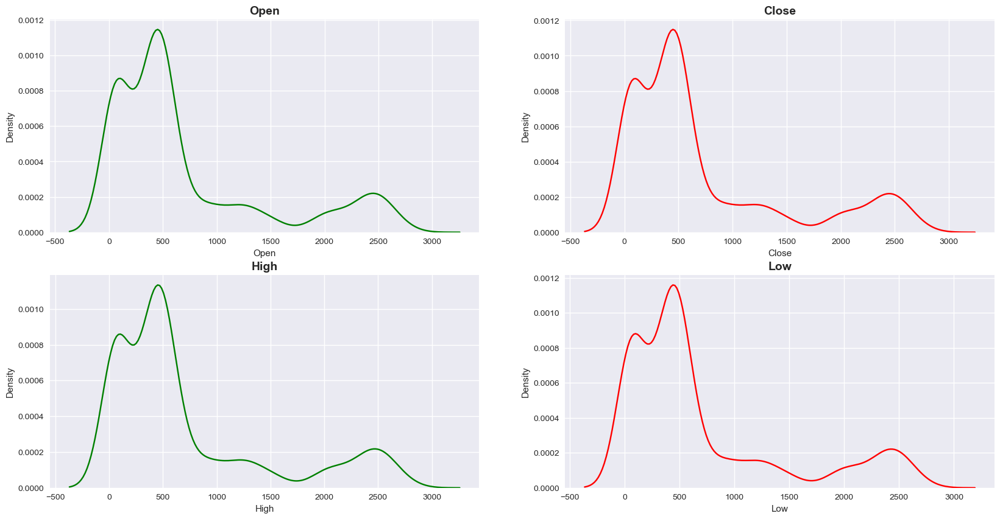

In [13]:
# KDE-Plots
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
sns.kdeplot(reliance_1['Open'], color='green')
plt.title('Open')
#Plot 2
plt.subplot(2,2,2)
sns.kdeplot(reliance_1['Close'], color='red')
plt.title('Close')
#Plot 3
plt.subplot(2,2,3)
sns.kdeplot(reliance_1['High'], color='green')
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
sns.kdeplot(reliance_1['Low'], color='red')
plt.title('Low')

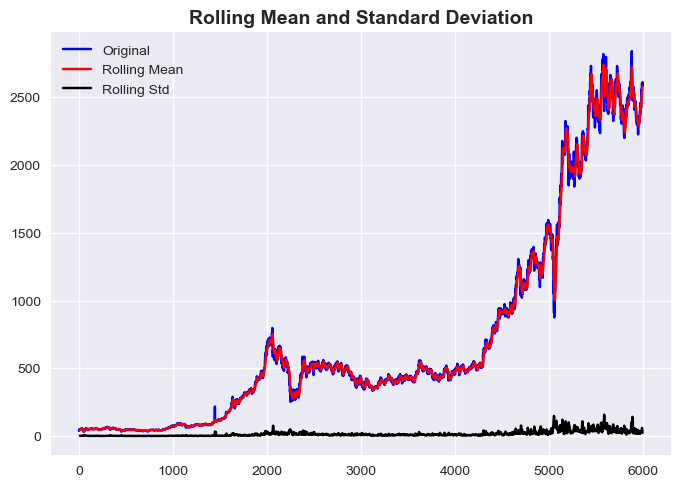

Results of dickey fuller test
Test Statistics                   0.690491
p-value                           0.989646
No. of lags used                 32.000000
Number of observations used    5961.000000
critical value (1%)              -3.431447
critical value (5%)              -2.862025
critical value (10%)             -2.567028
dtype: float64


In [14]:
#Test for staionarity
def test_stationarity(timeseries):
    #Determing rolling statistics
    rolmean = timeseries.rolling(12).mean()
    rolstd = timeseries.rolling(12).std()
    #Plot rolling statistics:
    plt.plot(timeseries, color='blue',label='Original')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)
    
    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    #hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)
    
test_stationarity(reliance_1['Close'])

Through the above graph, we can see the increasing mean and standard deviation and hence our series is not stationary.

We see that the p-value is greater than 0.05 so we cannot reject the Null hypothesis. Also, the test statistics is greater than the critical values. so the data is non-stationary.

In order to perform a time series analysis, we may need to separate seasonality and trend from our series. The resultant series will become stationary through this process.

So let us separate Trend and Seasonality from the time series.

<Figure size 800x550 with 0 Axes>

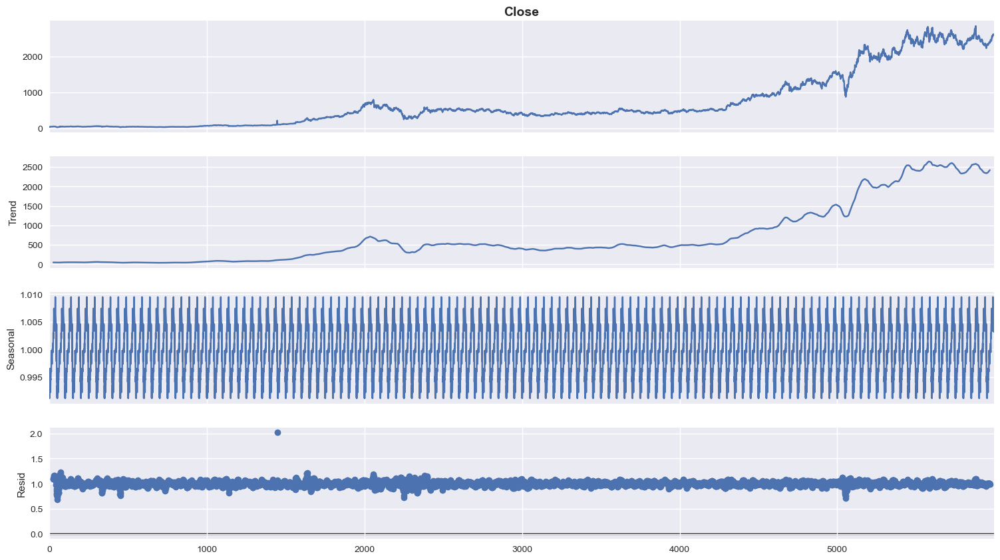

In [15]:
#To separate the trend and the seasonality from a time series, 
# we can decompose the series using the following code.
result = seasonal_decompose(reliance_1['Close'], model='multiplicative', period = 50)
fig = plt.figure()  
fig = result.plot()  
fig.set_size_inches(16, 9)

We start by taking a log of the series to reduce the magnitude of the values and reduce the rising trend in the series. Then after getting the log of the series, we find the rolling average of the series. A rolling average is calculated by taking input for the past 12 months and giving a mean consumption value at every point further ahead in series.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


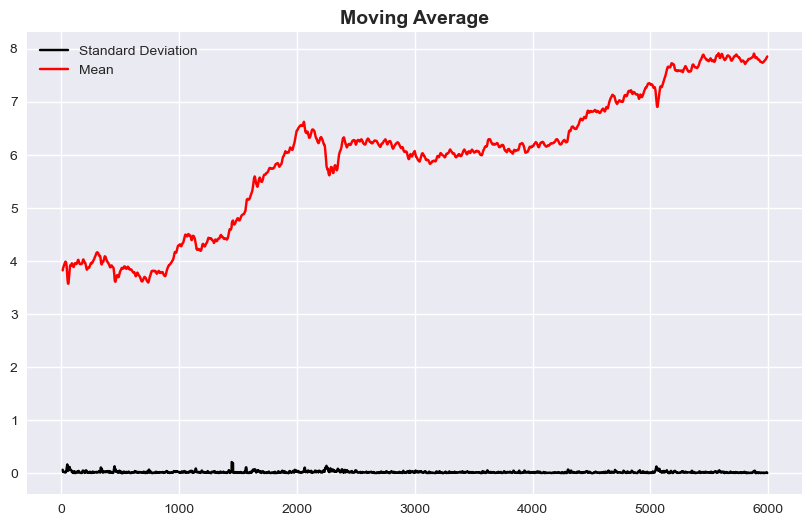

In [16]:
#if not stationary then eliminate trend
#Eliminate trend
from pylab import rcParams
rcParams['figure.figsize'] = 10, 6
df_log = np.log(reliance_1['Close'])
moving_avg = df_log.rolling(12).mean()
std_dev = df_log.rolling(12).std()
plt.legend(loc='best')
plt.title('Moving Average')
plt.plot(std_dev, color ="black", label = "Standard Deviation")
plt.plot(moving_avg, color="red", label = "Mean")
plt.legend()
plt.show()

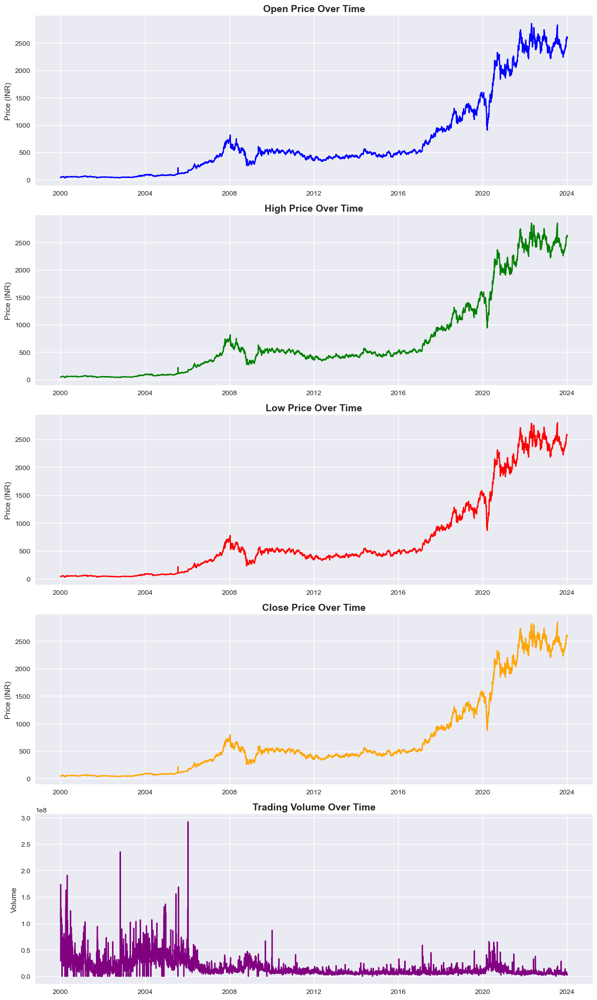

In [17]:
# Creating a figure with 5 subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 20))

# Plotting different attributes of the stock data
axes[0].plot(reliance_1['Date'], reliance_1['Open'], color='blue', label='Open Price')
axes[0].set_title('Open Price Over Time')
axes[0].set_ylabel('Price (INR)')
axes[0].grid(True)

axes[1].plot(reliance_1['Date'], reliance_1['High'], color='green', label='High Price')
axes[1].set_title('High Price Over Time')
axes[1].set_ylabel('Price (INR)')
axes[1].grid(True)

axes[2].plot(reliance_1['Date'], reliance_1['Low'], color='red', label='Low Price')
axes[2].set_title('Low Price Over Time')
axes[2].set_ylabel('Price (INR)')
axes[2].grid(True)

axes[3].plot(reliance_1['Date'], reliance_1['Close'], color='orange', label='Close Price')
axes[3].set_title('Close Price Over Time')
axes[3].set_ylabel('Price (INR)')
axes[3].grid(True)

axes[4].plot(reliance_1['Date'], reliance_1['Volume'], color='purple', label='Volume')
axes[4].set_title('Trading Volume Over Time')
axes[4].set_ylabel('Volume')
axes[4].grid(True)


# Adjust layout
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Low')

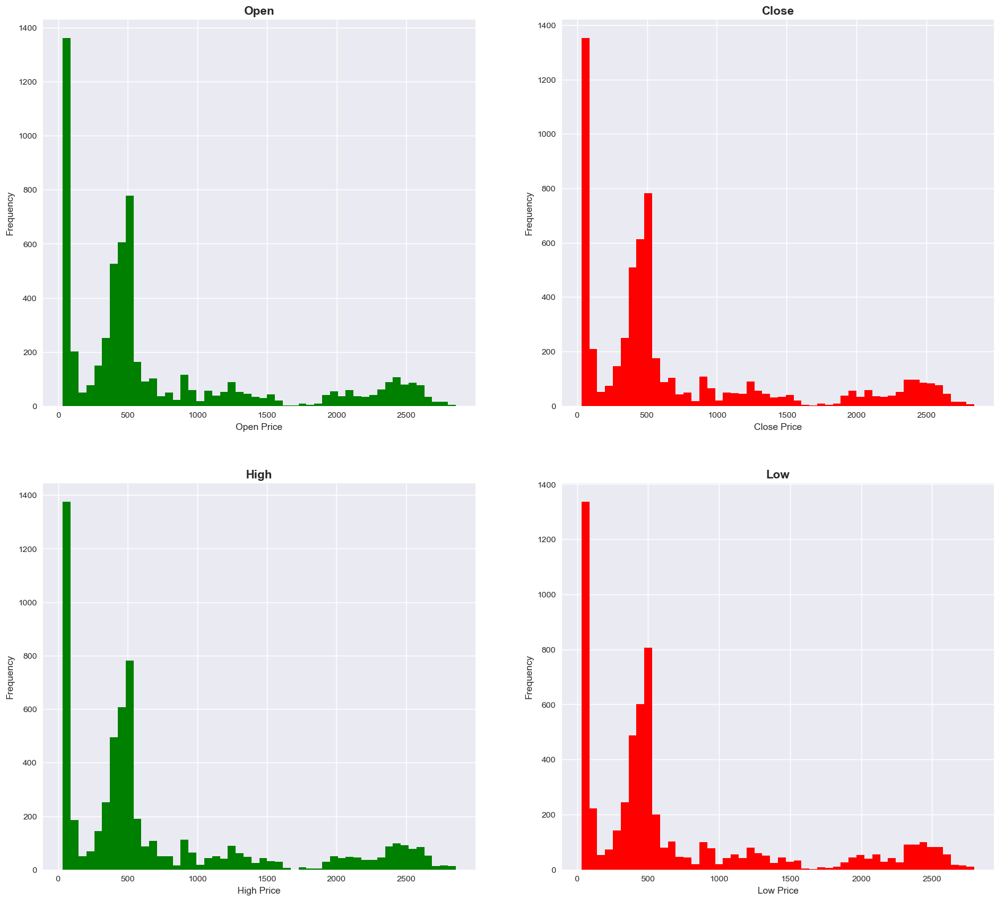

In [18]:
# Ploting Histogram
plt.figure(figsize=(20,18))
#Plot 1
plt.subplot(2,2,1)
plt.hist(reliance_1['Open'],bins=50, color='green')
plt.xlabel("Open Price")
plt.ylabel("Frequency")
plt.title('Open')
#Plot 2
plt.subplot(2,2,2)
plt.hist(reliance_1['Close'],bins=50, color='red')
plt.xlabel("Close Price")
plt.ylabel("Frequency")
plt.title('Close')
#Plot 3
plt.subplot(2,2,3)
plt.hist(reliance_1['High'],bins=50, color='green')
plt.xlabel("High Price")
plt.ylabel("Frequency")
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.hist(reliance_1['Low'],bins=50, color='red')
plt.xlabel("Low Price")
plt.ylabel("Frequency")
plt.title('Low')

C:\Users\91901\AppData\Local\Temp\ipykernel_12752\3601982156.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(reliance_1.corr(),annot=True)


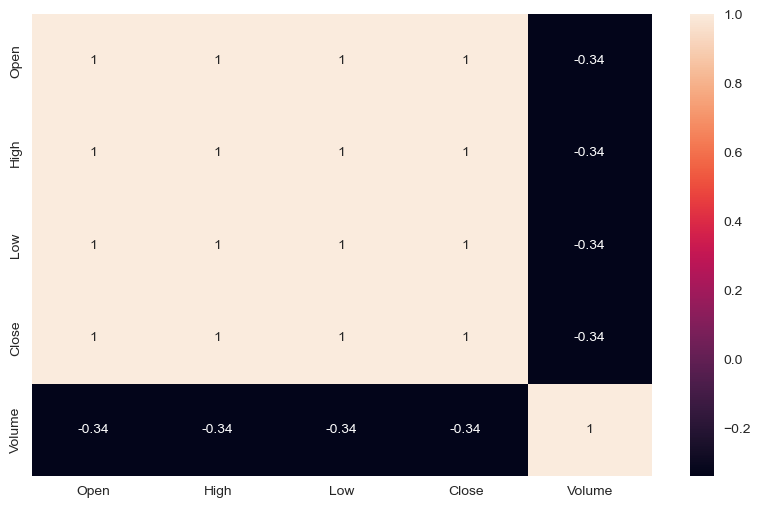

In [19]:
sns.heatmap(reliance_1.corr(),annot=True)
plt.show()

In [20]:
import plotly.graph_objects as go
import plotly.express as px
colors = ['#235E72']
# Group data by Year and calculate the average rating
average_rating_by_year = reliance_1.groupby('Date')['Close'].mean().reset_index()

# Create the line plot with Plotly Express
fig = px.line(average_rating_by_year, x='Date', y='Close', color_discrete_sequence=['#559C9E'])
fig.update_layout(title='Are there any trends in Close Price across year?', title_x=0.5, title_pad=dict(t=20), title_font=dict(size=20), xaxis_title='Year', yaxis_title='Rating', xaxis=dict(showgrid=False), yaxis=dict(showgrid=False), plot_bgcolor = 'white')
fig.show()

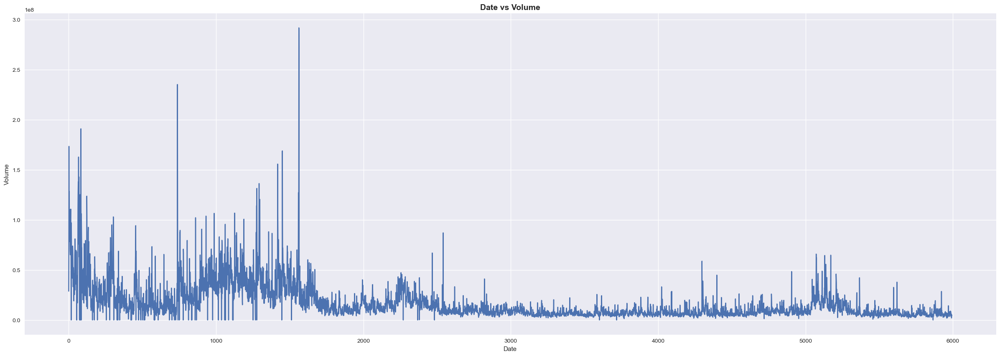

In [21]:
figure=plt.figure(figsize=(30,10))
plt.plot(reliance_1['Volume'])
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Date vs Volume')
plt.show()

## Finding long-term and short-term trends

### Moving Average

In [22]:
reliance_ma=reliance_1.copy()
reliance_ma['30-day MA']=reliance_1['Close'].rolling(window=30).mean()
reliance_ma['200-day MA']=reliance_1['Close'].rolling(window=200).mean()

In [23]:
reliance_ma

,Date,Open,High,Low,Close,Volume,30-day MA,200-day MA
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010,NaN,NaN
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457,NaN,NaN
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953,NaN,NaN
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113,NaN,NaN
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756,NaN,NaN
...,...,...,...,...,...,...,...,...
5989,2023-12-29,2611.100098,2614.000000,2579.300049,2584.949951,5432292,2459.571672,2437.490753
5990,2024-01-01,2580.550049,2606.850098,2573.149902,2590.250000,2015270,2467.223340,2438.355253
5991,2024-01-02,2585.000000,2615.000000,2573.000000,2611.699951,3724400,2475.761670,2439.617502
5992,2024-01-03,2610.000000,2634.000000,2577.199951,2583.300049,4518768,2483.560002,2440.920503


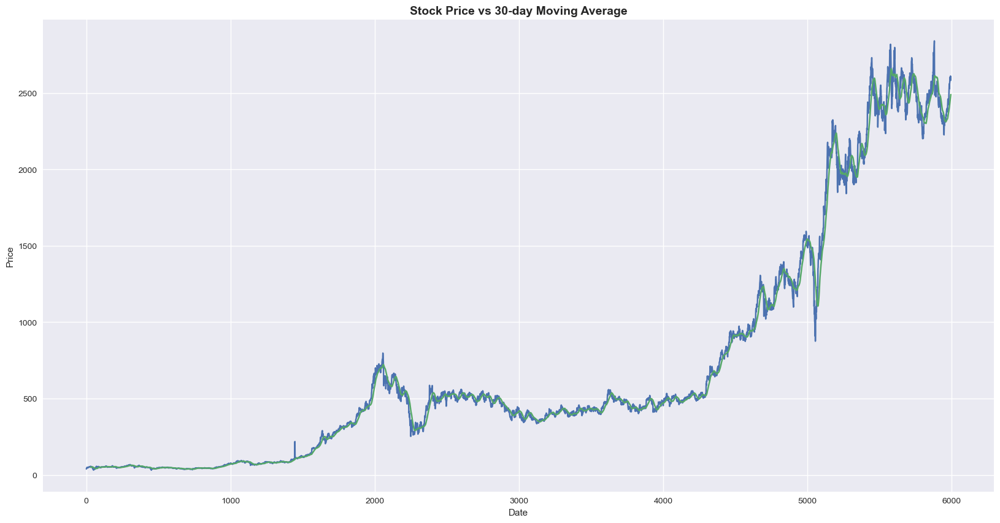

In [24]:
plt.figure(figsize=(20,10))
plt.plot(reliance_ma['Close'],label='Original data')
plt.plot(reliance_ma['30-day MA'],label='30-MA')
plt.legend
plt.title('Stock Price vs 30-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

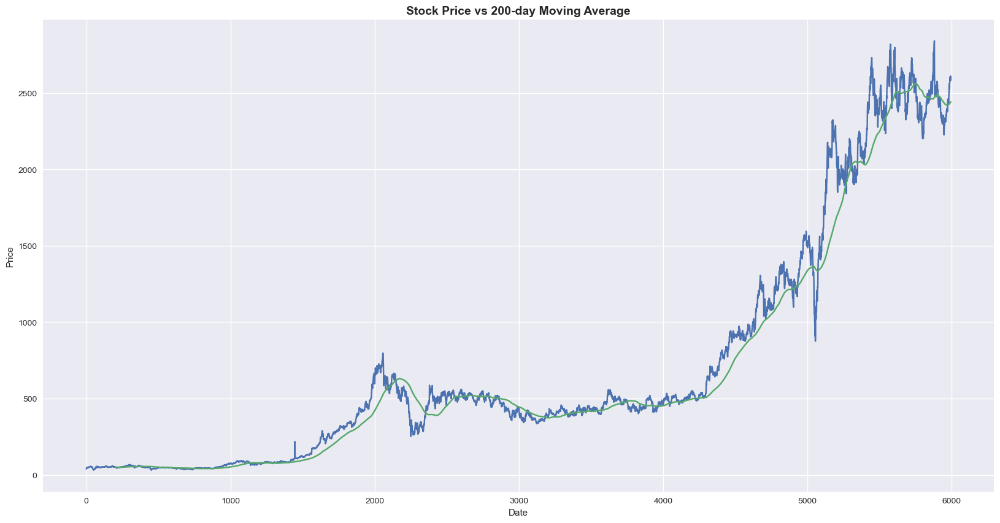

In [25]:
plt.figure(figsize=(20,10))
plt.plot(reliance_ma['Close'],label='Original data')
plt.plot(reliance_ma['200-day MA'],label='200-MA')
plt.legend
plt.title('Stock Price vs 200-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

Long term and short term trends can be identified using the Moving Average graphs
- In long term, Stock price is in upward trend
- Short term trends can be identified from MA-30 chart
- Stock had a major short term downtrend during the year 2020
- It may be due to the bearish market during the Covid-19 outbraek

# Model Construction and Evaluation

In [26]:
# Setting the date column as index
reliance_1=reliance_1.set_index('Date')
reliance_1

,Open,High,Low,Close,Volume
Date,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,28802010
2000-01-04,39.981236,42.062302,38.882679,42.062302,61320457
2000-01-05,39.710464,44.545658,39.710464,43.710136,173426953
2000-01-06,44.715855,46.526150,44.715855,45.543640,101355113
2000-01-07,45.644211,49.187443,45.334759,48.669109,128426756
...,...,...,...,...,...
2023-12-29,2611.100098,2614.000000,2579.300049,2584.949951,5432292
2024-01-01,2580.550049,2606.850098,2573.149902,2590.250000,2015270
2024-01-02,2585.000000,2615.000000,2573.000000,2611.699951,3724400


#### Creating dataframe which only includes date and close time

In [27]:
close_df=pd.DataFrame(reliance_1['Close'])
close_df

,Close
Date,
2000-01-03,38.944569
2000-01-04,42.062302
2000-01-05,43.710136
2000-01-06,45.543640
2000-01-07,48.669109
...,...
2023-12-29,2584.949951
2024-01-01,2590.250000
2024-01-02,2611.699951


In [28]:
print(close_df.shape)

(5994, 1)


In [29]:
close_df=close_df.reset_index()

In [30]:
close_df['Date']

0      2000-01-03
1      2000-01-04
2      2000-01-05
3      2000-01-06
4      2000-01-07
          ...    
5989   2023-12-29
5990   2024-01-01
5991   2024-01-02
5992   2024-01-03
5993   2024-01-04
Name: Date, Length: 5994, dtype: datetime64[ns]

## Normalizing / scaling close value between 0 to 1

In [31]:
close_stock = close_df.copy()
del close_df['Date']
scaler=MinMaxScaler(feature_range=(0,1))
closedf=scaler.fit_transform(np.array(close_df).reshape(-1,1))
print(closedf.shape)

(5994, 1)


### Split data for training and testing
- Ratio for training and testing data is 86:14

In [32]:
training_size=int(len(closedf)*0.86)
test_size=len(closedf)-training_size
train_data,test_data=closedf[0:training_size,:],closedf[training_size:len(closedf),:1]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (5154, 1)
test_data:  (840, 1)


### Create new dataset according to requirement of time-series prediction

In [33]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [34]:
# reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 13
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print("y_test", y_test.shape)

X_train:  (5140, 13)
y_train:  (5140,)
X_test:  (826, 13)
y_test (826,)


# Algorithms

## Support vector regression - SVR

In [35]:
import math
from sklearn.svm import SVR

svr_rbf = SVR(kernel= 'rbf', C= 1e3, gamma= 0.01)
svr_rbf.fit(X_train, y_train)

SVR(C=1000.0, gamma=0.01)

In [36]:
# Lets Do the prediction 

train_predict=svr_rbf.predict(X_train)
test_predict=svr_rbf.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5140, 1)
Test data prediction: (826, 1)


In [37]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

### Evaluation metrices RMSE, MSE and MAE

Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [38]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))


Train data RMSE:  179.03561587158862
Train data MSE:  32053.751750519037
Test data MAE:  168.26781755926334
-------------------------------------------------------------------------------------
Test data RMSE:  146.9114075108424
Test data MSE:  21582.9616568168
Test data MAE:  127.41610386103204


### Explained variance regression score

The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [39]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9648757895723143
Test data explained variance regression score: 0.8805277880605271


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best

0 or < 0 = worse

In [40]:
train_r2_svr=r2_score(original_ytrain, train_predict)
test_r2_svr=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_svr)
print("Test data R2 score:", test_r2_svr)

Train data R2 score: 0.7790614274336243
Test data R2 score: 0.5758385441403677


### Comparision between original stock close price vs predicted close price

In [41]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5994, 1)
Test predicted data:  (5994, 1)


### Predicting next 30 days

In [42]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = svr_rbf.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = svr_rbf.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [43]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [44]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting whole closing stock price with prediction

In [45]:
svrdf=closedf.tolist()
svrdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
svrdf=scaler.inverse_transform(svrdf).reshape(1,-1).tolist()[0]

names = cycle(['Close Price'])

fig = px.line(svrdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

## Random Forest Regressor - RF

In [46]:
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=0)

In [47]:
# Lets Do the prediction 

train_predict=regressor.predict(X_train)
test_predict=regressor.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5140, 1)
Test data prediction: (826, 1)


In [48]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

### Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [49]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  5.021303401429528
Train data MSE:  25.21348784920775
Test data MAE:  2.6769656142409155
-------------------------------------------------------------------------------------
Test data RMSE:  347.9727674885123
Test data MSE:  121085.04691361425
Test data MAE:  303.1429702766184


### Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [50]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9998262097272985
Test data explained variance regression score: -0.028859644036721033


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best
0 or < 0 = worse

In [51]:
train_r2_rf=r2_score(original_ytrain, train_predict)
test_r2_rf=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_rf)
print("Test data R2 score:", test_r2_rf)

Train data R2 score: 0.9998262096724845
Test data R2 score: -1.3796367986174407


### Comparision between original stock close price vs predicted close price

In [52]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5994, 1)
Test predicted data:  (5994, 1)


### Predicting next 30 days

In [53]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = regressor.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = regressor.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))


Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [54]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [55]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting whole closing stock price with prediction

In [56]:
rfdf=closedf.tolist()
rfdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
rfdf=scaler.inverse_transform(rfdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(rfdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### K-nearest neighgbour - KNN

In [57]:
from sklearn import neighbors

K = time_step
neighbor = neighbors.KNeighborsRegressor(n_neighbors = K)
neighbor.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=13)

In [58]:
# Lets Do the prediction 

train_predict=neighbor.predict(X_train)
test_predict=neighbor.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (5140, 1)
Test data prediction: (826, 1)


In [59]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

### Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [60]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  15.60612727100037
Train data MSE:  243.55120839866146
Test data MAE:  8.182013482884779
-------------------------------------------------------------------------------------
Test data RMSE:  332.31719809551686
Test data MSE:  110434.720150055
Test data MAE:  287.67132405796013


### Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [61]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9983213523639216
Test data explained variance regression score: 0.045156378039993283


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best
0 or < 0 = worse

In [62]:
train_r2_knn=r2_score(original_ytrain, train_predict)
test_r2_knn=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_knn)
print("Test data R2 score:", test_r2_knn)

Train data R2 score: 0.9983212618370159
Test data R2 score: -1.1703301160016517


### Comparision between original stock close price vs predicted close price

In [63]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5994, 1)
Test predicted data:  (5994, 1)


### Predicting next 30 days

In [64]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = neighbor.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = neighbor.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [65]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [66]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


### Plotting whole closing stock price with prediction

In [67]:
knndf=closedf.tolist()
knndf.extend((np.array(lst_output).reshape(-1,1)).tolist())
knndf=scaler.inverse_transform(knndf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(knndf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


### LSTM

In [68]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (5140, 13, 1)
X_test:  (826, 13, 1)


### LSTM model structure

In [69]:
tf.keras.backend.clear_session()
model=Sequential()
model.add(LSTM(32,return_sequences=True,input_shape=(time_step,1)))
model.add(LSTM(32,return_sequences=True))
model.add(LSTM(32))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')

In [70]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 13, 32)            4352      
                                                                 
 lstm_1 (LSTM)               (None, 13, 32)            8320      
                                                                 
 lstm_2 (LSTM)               (None, 32)                8320      
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 21025 (82.13 KB)
Trainable params: 21025 (82.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [71]:
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=100,batch_size=32,verbose=1)

Epoch 1/100
161/161 [==============================] - 17s 44ms/step - loss: 0.0017 - val_loss: 0.0034
Epoch 2/100
161/161 [==============================] - 5s 30ms/step - loss: 1.4517e-04 - val_loss: 0.0011
Epoch 3/100
161/161 [==============================] - 5s 30ms/step - loss: 1.5828e-04 - val_loss: 0.0011
Epoch 4/100
161/161 [==============================] - 5s 30ms/step - loss: 1.5000e-04 - val_loss: 9.5545e-04
Epoch 5/100
161/161 [==============================] - 5s 30ms/step - loss: 1.4759e-04 - val_loss: 0.0026
Epoch 6/100
161/161 [==============================] - 5s 30ms/step - loss: 1.3117e-04 - val_loss: 9.3474e-04
Epoch 7/100
161/161 [==============================] - 5s 29ms/step - loss: 1.4252e-04 - val_loss: 0.0010
Epoch 8/100
161/161 [==============================] - 5s 30ms/step - loss: 1.2595e-04 - val_loss: 7.4153e-04
Epoch 9/100
161/161 [==============================] - 5s 29ms/step - loss: 1.1464e-04 - val_loss: 7.7156e-04
Epoch 10/100
161/161 [===========

161/161 [==============================] - 5s 30ms/step - loss: 2.7053e-05 - val_loss: 2.6725e-04
Epoch 76/100
161/161 [==============================] - 4s 27ms/step - loss: 2.4269e-05 - val_loss: 3.4709e-04
Epoch 77/100
161/161 [==============================] - 5s 30ms/step - loss: 2.8113e-05 - val_loss: 0.0011
Epoch 78/100
161/161 [==============================] - 5s 30ms/step - loss: 2.9591e-05 - val_loss: 6.6637e-04
Epoch 79/100
161/161 [==============================] - 5s 29ms/step - loss: 2.7502e-05 - val_loss: 2.7931e-04
Epoch 80/100
161/161 [==============================] - 5s 30ms/step - loss: 2.4555e-05 - val_loss: 2.1378e-04
Epoch 81/100
161/161 [==============================] - 5s 30ms/step - loss: 2.4739e-05 - val_loss: 2.2564e-04
Epoch 82/100
161/161 [==============================] - 5s 29ms/step - loss: 3.3955e-05 - val_loss: 6.3758e-04
Epoch 83/100
161/161 [==============================] - 5s 30ms/step - loss: 2.5111e-05 - val_loss: 1.8513e-04
Epoch 84/100
161/1

In [72]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

26/26 [==============================] - 0s 8ms/step


((5140, 1), (826, 1))

In [73]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

### Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [74]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  14.460292392008066
Train data MSE:  209.10005606236638
Test data MAE:  10.63662250459426
-------------------------------------------------------------------------------------
Test data RMSE:  40.232501808281164
Test data MSE:  1618.6542017533473
Test data MAE:  30.077180654604266


### Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [75]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9988156872904853
Test data explained variance regression score: 0.9691037541050876


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best
0 or < 0 = worse

In [76]:
train_r2_lstm=r2_score(original_ytrain, train_predict)
test_r2_lstm=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_lstm)
print("Test data R2 score:", test_r2_lstm)

Train data R2 score: 0.9985587250980934
Test data R2 score: 0.9681892256648585


### Comparision between original stock close price vs predicted close price

In [77]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5994, 1)
Test predicted data:  (5994, 1)


### Predicting next 30 days

In [78]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input = x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        
        yhat = model.predict(x_input, verbose=0)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model.predict(x_input, verbose=0)
        temp_input.extend(yhat[0].tolist())
        
        lst_output.extend(yhat.tolist())
        i=i+1
               
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [79]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [80]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')

fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting whole closing stock price with prediction

In [81]:
lstmdf=closedf.tolist()
lstmdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
lstmdf=scaler.inverse_transform(lstmdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(lstmdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')

fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### GRU (Gated Recurrent Unit)

In [82]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (5140, 13, 1)
X_test:  (826, 13, 1)


In [83]:
tf.keras.backend.clear_session()
model=Sequential()
model.add(GRU(32,return_sequences=True,input_shape=(time_step,1)))
model.add(GRU(32,return_sequences=True))
model.add(GRU(32,return_sequences=True))
model.add(GRU(32))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')

In [84]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 13, 32)            3360      
                                                                 
 gru_1 (GRU)                 (None, 13, 32)            6336      
                                                                 
 gru_2 (GRU)                 (None, 13, 32)            6336      
                                                                 
 gru_3 (GRU)                 (None, 32)                6336      
                                                                 
 dense (Dense)               (None, 1)                 33        
                                                                 
Total params: 22401 (87.50 KB)
Trainable params: 22401 (87.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [85]:
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=100,batch_size=32,verbose=1)

Epoch 1/100
161/161 [==============================] - 23s 58ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 2/100
161/161 [==============================] - 7s 42ms/step - loss: 1.0457e-04 - val_loss: 0.0017
Epoch 3/100
161/161 [==============================] - 6s 40ms/step - loss: 9.2384e-05 - val_loss: 7.9334e-04
Epoch 4/100
161/161 [==============================] - 7s 41ms/step - loss: 9.6989e-05 - val_loss: 8.7172e-04
Epoch 5/100
161/161 [==============================] - 7s 41ms/step - loss: 9.4648e-05 - val_loss: 5.7339e-04
Epoch 6/100
161/161 [==============================] - 6s 38ms/step - loss: 9.0032e-05 - val_loss: 0.0014
Epoch 7/100
161/161 [==============================] - 7s 42ms/step - loss: 6.5837e-05 - val_loss: 4.1652e-04
Epoch 8/100
161/161 [==============================] - 7s 42ms/step - loss: 6.9275e-05 - val_loss: 5.1231e-04
Epoch 9/100
161/161 [==============================] - 7s 42ms/step - loss: 6.7232e-05 - val_loss: 5.6811e-04
Epoch 10/100
161/161 [===

161/161 [==============================] - 7s 40ms/step - loss: 2.9417e-05 - val_loss: 2.6871e-04
Epoch 76/100
161/161 [==============================] - 7s 41ms/step - loss: 3.0165e-05 - val_loss: 5.5848e-04
Epoch 77/100
161/161 [==============================] - 7s 41ms/step - loss: 2.5295e-05 - val_loss: 2.3963e-04
Epoch 78/100
161/161 [==============================] - 7s 42ms/step - loss: 2.6133e-05 - val_loss: 3.1513e-04
Epoch 79/100
161/161 [==============================] - 7s 41ms/step - loss: 2.7618e-05 - val_loss: 2.8186e-04
Epoch 80/100
161/161 [==============================] - 7s 43ms/step - loss: 2.7492e-05 - val_loss: 2.8116e-04
Epoch 81/100
161/161 [==============================] - 7s 42ms/step - loss: 3.2613e-05 - val_loss: 3.7732e-04
Epoch 82/100
161/161 [==============================] - 7s 42ms/step - loss: 3.2105e-05 - val_loss: 4.9576e-04
Epoch 83/100
161/161 [==============================] - 7s 43ms/step - loss: 2.5757e-05 - val_loss: 9.6816e-04
Epoch 84/100
1

In [86]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

26/26 [==============================] - 0s 9ms/step


((5140, 1), (826, 1))

In [87]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1))

### Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [88]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  13.43012984958606
Train data MSE:  180.36838777674245
Test data MAE:  7.7724681505433315
-------------------------------------------------------------------------------------
Test data RMSE:  59.05405877820769
Test data MSE:  3487.3818581800087
Test data MAE:  47.419055412237064


### Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [89]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9988649599694726
Test data explained variance regression score: 0.9627878272789797


### R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best
0 or < 0 = worse

In [90]:
train_r2_gru=r2_score(original_ytrain, train_predict)
test_r2_gru=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_gru)
print("Test data R2 score:", test_r2_gru)

Train data R2 score: 0.9987567653720646
Test data R2 score: 0.9314638560905331


### Comparision between original stock close price vs predicted close price

In [91]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)


names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5994, 1)
Test predicted data:  (5994, 1)


In [92]:
plotdf.head(100)

,Date,original_close,train_predicted_close,test_predicted_close
0,2000-01-03,38.944569,NaN,NaN
1,2000-01-04,42.062302,NaN,NaN
2,2000-01-05,43.710136,NaN,NaN
3,2000-01-06,45.543640,NaN,NaN
4,2000-01-07,48.669109,NaN,NaN
...,...,...,...,...
95,2000-05-15,49.435001,50.259548,NaN
96,2000-05-16,49.110077,50.695728,NaN
97,2000-05-17,49.334431,50.393822,NaN
98,2000-05-18,47.980576,50.470432,NaN


### Predicting next 30 days

In [93]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input = x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        
        yhat = model.predict(x_input, verbose=0)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model.predict(x_input, verbose=0)
        temp_input.extend(yhat[0].tolist())
        
        lst_output.extend(yhat.tolist())
        i=i+1
               
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [94]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [95]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})
names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Plotting whole closing stock price with prediction

In [96]:
grudf=closedf.tolist()
grudf.extend((np.array(lst_output).reshape(-1,1)).tolist())
grudf=scaler.inverse_transform(grudf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])
fig = px.line(grudf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [97]:
finaldf = pd.DataFrame({
    'svr':svrdf,
    'rf':rfdf,
    'knn':knndf,
    'lstm':lstmdf,
    'gru':grudf,
})
finaldf

,svr,rf,knn,lstm,gru
0,38.944569,38.944569,38.944569,38.944569,38.944569
1,42.062302,42.062302,42.062302,42.062302,42.062302
2,43.710136,43.710136,43.710136,43.710136,43.710136
3,45.543640,45.543640,45.543640,45.543640,45.543640
4,48.669109,48.669109,48.669109,48.669109,48.669109
...,...,...,...,...,...
6019,2035.464240,2126.048562,2112.023118,2396.770481,2080.628666
6020,2023.511429,2126.166062,2112.023118,2394.183570,2073.170631
6021,2012.066386,2126.166062,2112.023118,2391.746082,2066.035395
6022,2000.852279,2126.048562,2112.023118,2389.448634,2059.205033


### Conclusion Chart

In [98]:
names = cycle(['SVR', 'RF','KNN','LSTM','GRU'])

fig = px.line(finaldf[225:], x=finaldf.index[225:], y=[finaldf['svr'][225:],finaldf['rf'][225:], finaldf['knn'][225:], 
                                          finaldf['lstm'][225:], finaldf['gru'][225:],],
             labels={'x': 'Timestamp','value':'Stock close price'})
fig.update_layout(title_text='Final stock analysis chart', font_size=15, font_color='black',legend_title_text='Algorithms',width=1000, height=600)

fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

In [99]:
data={"Model": ["SVR", "Random Forest", "KNN", "LSTM", "GRU"],
    "Train R2 Score": [train_r2_svr, train_r2_rf,train_r2_knn, train_r2_lstm, train_r2_gru],
    "Test R2 Score": [test_r2_svr, test_r2_rf, test_r2_knn, test_r2_lstm, test_r2_gru]}
df=pd.DataFrame(data)
df

,Model,Train R2 Score,Test R2 Score
0,SVR,0.779061,0.575839
1,Random Forest,0.999826,-1.379637
2,KNN,0.998321,-1.170330
3,LSTM,0.998559,0.968189
4,GRU,0.998757,0.931464


## By Looking into this table we can say that our LSTM model have best R2 score.

## so we are going to use LSTM model for our deployment part.

In [101]:
from tensorflow.keras.layers import Dense,Dropout

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 100, 50)           10400     
                                                                 
 dropout (Dropout)           (None, 100, 50)           0         
                                                                 
 lstm_2 (LSTM)               (None, 100, 60)           26640     
                                                                 
 dropout_1 (Dropout)         (None, 100, 60)           0         
                                                                 
 lstm_3 (LSTM)               (None, 100, 80)           45120     
                                                                 
 dropout_2 (Dropout)         (None, 100, 80)           0         
                                                                 
 lstm_4 (LSTM)               (None, 120)              

27/27 [==============================] - 10s 388ms/step - loss: 0.0051
Epoch 80/100
27/27 [==============================] - 10s 387ms/step - loss: 0.0046
Epoch 81/100
27/27 [==============================] - 11s 391ms/step - loss: 0.0049
Epoch 82/100
27/27 [==============================] - 10s 385ms/step - loss: 0.0051
Epoch 83/100
27/27 [==============================] - 11s 390ms/step - loss: 0.0047
Epoch 84/100
27/27 [==============================] - 10s 364ms/step - loss: 0.0045
Epoch 85/100
27/27 [==============================] - 11s 392ms/step - loss: 0.0047
Epoch 86/100
27/27 [==============================] - 10s 387ms/step - loss: 0.0044
Epoch 87/100
27/27 [==============================] - 11s 391ms/step - loss: 0.0047
Epoch 88/100
27/27 [==============================] - 10s 385ms/step - loss: 0.0046
Epoch 89/100
27/27 [==============================] - 11s 391ms/step - loss: 0.0041
Epoch 90/100
27/27 [==============================] - 10s 362ms/step - loss: 0.0043
Epoch

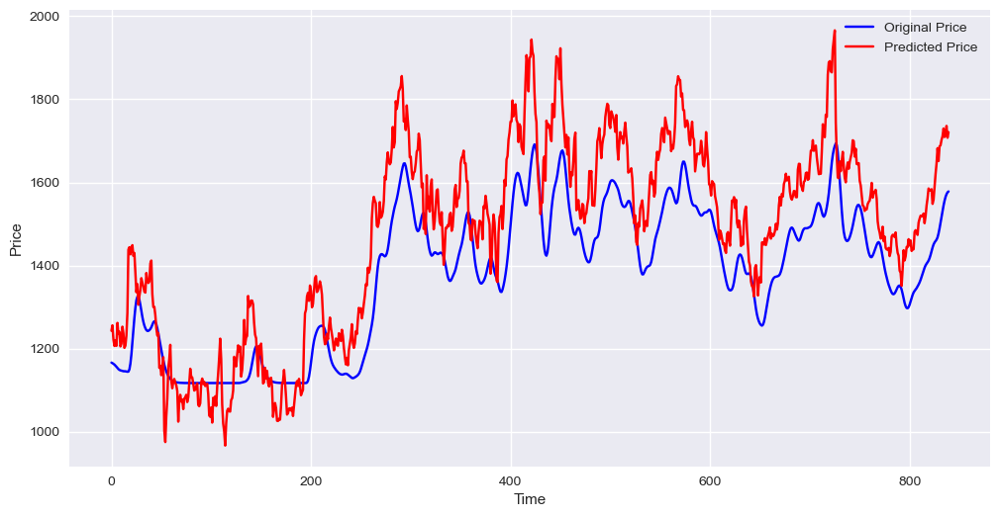

In [102]:
data_train= pd.DataFrame(reliance_0.Close[0:int(len(reliance_0)*0.86)])
data_test = pd.DataFrame(reliance_0.Close[int(len(reliance_0)*0.86):len(reliance_0)])




# scaling of data using min max scaler (0,1)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))

past_100_days=data_train.tail(100)
data_test=pd.concat([past_100_days,data_test],ignore_index=True)
data_test_scaler=scaler.fit_transform(data_test) 

x=[]
y=[]

for i in range (100, data_test_scaler.shape[0]):
    x.append(data_test_scaler[i-100 : i])
    y.append(data_test_scaler[i, 0])
x, y = np.array(x), np.array(y)

model4 = Sequential()
model4.add(LSTM(units= 50, activation= 'relu', return_sequences= True, 
               input_shape= (x.shape[1], 1)))

model4.add(Dropout(0.2))


model4.add(LSTM(units= 60, activation= 'relu', return_sequences= True))

model4.add(Dropout(0.3))


model4.add(LSTM(units= 80, activation= 'relu', return_sequences= True))

model4.add(Dropout(0.4))


model4.add(LSTM(units= 120, activation= 'relu'))

model4.add(Dropout(0.5))


model4.add(Dense(units= 1))

model4.summary()

model4.compile(optimizer='adam', loss="mean_squared_error")
model4.fit(x, y, epochs= 100)










predict=model4.predict(x) 
scale=1/scaler.scale_
predict=predict*scale
y=y*scale






# final Graph

fig3= plt.figure(figsize = (12,6))
plt.plot(predict, 'b', label = 'Original Price')
plt.plot(y, 'r', label = 'Predicted Price')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()

In [ ]:
model4.save('my_model.keras')